<center><img src="https://github.com/hse-ds/iad-applied-ds/blob/master/2021/hw/hw1/img/logo_hse.png?raw=1" width="1000"></center>

<h1><center>Прикладные задачи анализа данных</center></h1>
<h2><center>Домашнее задание 3: прогнозирование временных рядов</center></h2>

**Мягкий дедлайн:** 23:59MSK 19.05.2024

**Жесткий дедлайн:** 23:59MSK 26.05.2024

In [1]:
!pip install -r requirements.txt

In [2]:
import warnings
import gdown
import pandas as pd
import numpy as np
from copy import deepcopy
from etna.transforms import LagTransform
from etna.transforms import LinearTrendTransform

warnings.filterwarnings("ignore")

В данной задаче мы будем решать одну из актуальных практических задач, с которыми, в том числе, сталкиваются разработчики ETNA - прогнозирование объема необходимой наличности в банкоматах. Пожалуй, ни для кого не секрет, что отсутствие необходимой суммы в банкомате не делает клиента банка счастливее. В то же время, избыток заправленной в банкомат наличности приводит к упущенной выгоде - ведь, в конечном счете, эти деньги могли быть размещены в качестве краткосрочного депозита на межбанковском рынке. Для кредитной организации с обширной сетью банкоматов даже незначительное улучшение качества предсказания способно внести значительный вклад в прибыльность этой ветки бизнеса.

В качестве инструмента воспользуемся библиотекой ETNA, документацию можно прочитать [тут](https://docs.etna.ai/stable/), и [чат](https://t.me/etna_support) комьюнити.

Мы будем использовать дневные данные реальных банкоматов для чего возьмем мультисегментный датасет.

In [3]:
url = 'https://gist.githubusercontent.com/Polzovat123/4d6d5e544e93429c2d3db29196e9c918/raw/24b27e60f587128d71678e267f51cd48472c6a84/atms_daily_cash.csv'
output = 'atms_daily_cash.csv'
gdown.download(url=url, output=output, quiet=False, fuzzy=True)

df = pd.read_csv('atms_daily_cash.csv', index_col=False)

Downloading...
From: https://gist.githubusercontent.com/Polzovat123/4d6d5e544e93429c2d3db29196e9c918/raw/24b27e60f587128d71678e267f51cd48472c6a84/atms_daily_cash.csv
To: /content/atms_daily_cash.csv
100%|██████████| 258k/258k [00:00<00:00, 5.40MB/s]


Полученные данные были просуммированы по банкоматам и дням эксплуатации, после чего залиты в gist, откуда мы и берем их.

Взглянем на то, что представляют из себя данные после этих действий:

In [4]:
df.head()

,datetime,atm_id,operation_value
0,2017-08-16,74,2.059266
1,2017-08-17,74,1.029633
2,2017-08-18,74,0.686422
3,2017-08-19,74,33.301267
4,2017-08-20,74,-12.237921


### Задание 1. EDA (1.75 балл)

Проведите разведывательный анализ данных с помощью `ETNA`- постройте графики, на которых можно судить о наличии тренда, сезонности и прочих зависимостей. Проанализируйте корреляции. Какие выводы вы можете сделать?

Ссылку на туториал по EDA можно найти [тут](https://docs.etna.ai/stable/tutorials/103-EDA.html#EDA).

In [5]:
from etna.datasets import TSDataset

In [6]:
original_df = df.copy(deep=True)
original_df["timestamp"] = pd.to_datetime(original_df["datetime"])
original_df["target"] = original_df["operation_value"]
original_df["segment"] = original_df["atm_id"]
original_df.drop(columns=["datetime", "operation_value", "atm_id"], inplace=True)
original_df.head()

,timestamp,target,segment
0,2017-08-16,2.059266,74
1,2017-08-17,1.029633,74
2,2017-08-18,0.686422,74
3,2017-08-19,33.301267,74
4,2017-08-20,-12.237921,74


In [7]:
ts = TSDataset(original_df, freq="D")
ts.head(5)

segment,100,101,102,103,104,105,106,74,85,86,87,88,90,91,93,94,96,97,98,99
feature,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target
timestamp,,,,,,,,,,,,,,,,,,,,
2017-06-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.617780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.441486,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.235345,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-13.532317,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.398647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
ts.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
100,2017-08-11,2018-09-30,416,3,20,0,0,0,D
101,2017-08-11,2018-09-30,416,3,20,0,0,0,D
102,2017-08-02,2018-09-30,425,3,20,0,0,0,D
103,2017-08-08,2018-09-30,419,3,20,0,0,0,D
104,2017-08-07,2018-09-30,420,3,20,0,0,0,D
105,2017-07-28,2018-09-30,430,3,20,0,0,0,D
106,2017-08-09,2018-09-30,418,3,20,0,0,0,D
74,2017-08-16,2018-09-30,411,3,20,0,0,0,D
85,2017-08-03,2018-09-30,424,3,20,0,0,0,D


In [9]:
ts.info()

<class 'etna.datasets.TSDataset'>
num_segments: 20
num_exogs: 0
num_regressors: 0
num_known_future: 0
freq: D
         start_timestamp end_timestamp  length  num_missing
segments                                                   
100           2017-08-11    2018-09-30     416            3
101           2017-08-11    2018-09-30     416            3
102           2017-08-02    2018-09-30     425            3
103           2017-08-08    2018-09-30     419            3
104           2017-08-07    2018-09-30     420            3
105           2017-07-28    2018-09-30     430            3
106           2017-08-09    2018-09-30     418            3
74            2017-08-16    2018-09-30     411            3
85            2017-08-03    2018-09-30     424            3
86            2017-08-01    2018-09-30     426            3
87            2017-06-09    2018-09-30     479            3
88            2017-08-14    2018-09-30     413            3
90            2017-07-27    2018-09-30     431    

In [10]:
segments = ts.columns.get_level_values(0).unique().tolist()

In [11]:
import matplotlib.pyplot as plt

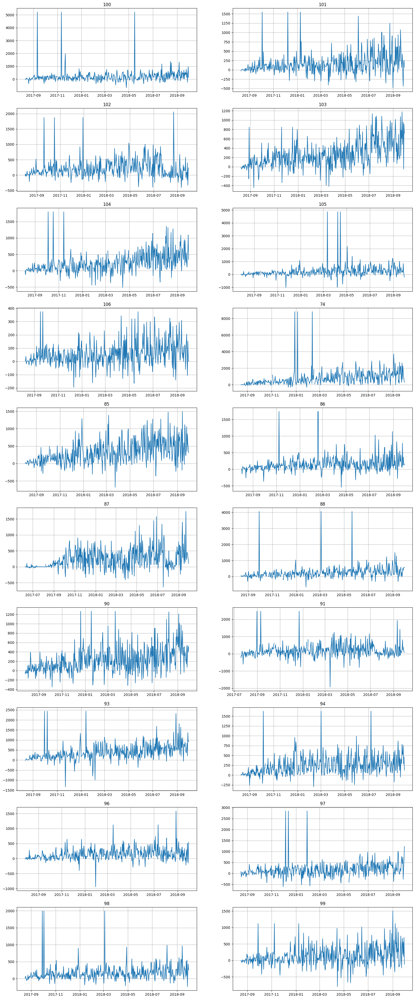

In [ ]:
ts.plot(segments = segments)
plt.show()

In [12]:
from etna.analysis import acf_plot

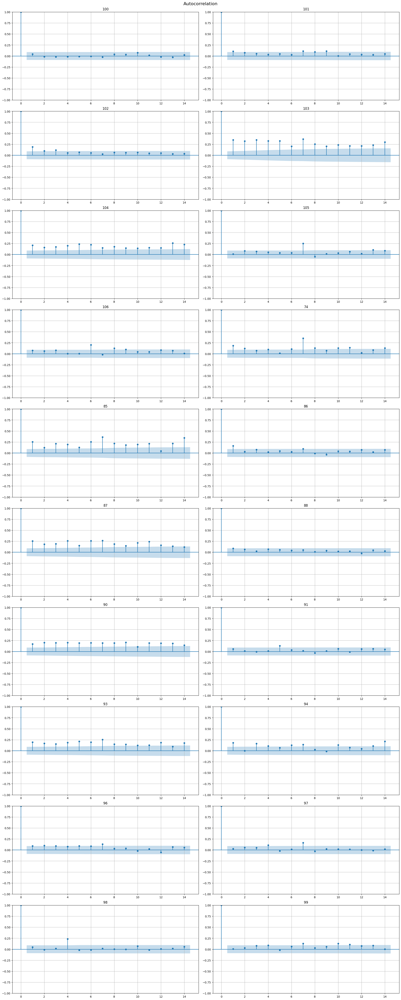

In [ ]:
acf_plot(ts, lags=14, segments = segments)

In [14]:
from etna.analysis import plot_trend

In [13]:
trends = [
    LinearTrendTransform(in_column="target", poly_degree=1),
    LinearTrendTransform(in_column="target", poly_degree=2),
]

In [ ]:
plot_trend(ts, trend_transform=trends, segments = segments)

Output hidden; open in https://colab.research.google.com to view.

In [15]:
from etna.analysis import plot_periodogram
from etna.analysis import seasonal_plot
from etna.analysis import stl_plot
from sklearn.impute import SimpleImputer

Заполним предварительно пропуски средним(пропусков не много, поэтому на определение тренда и сезонности это не повлияет)

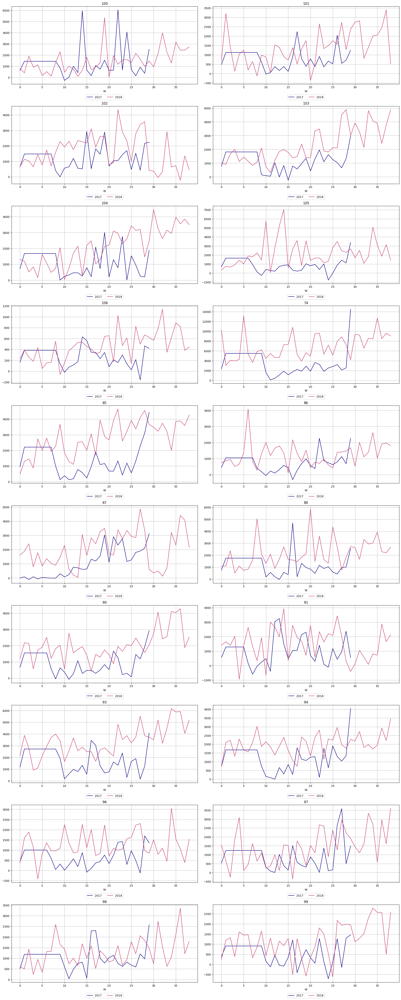

In [16]:
df = ts.to_pandas()

cleaned_df = df.fillna(df.mean()).copy(deep=True)

cleaned_ts = TSDataset(cleaned_df, freq="D")
seasonal_plot(cleaned_ts, freq='W', segments = segments)

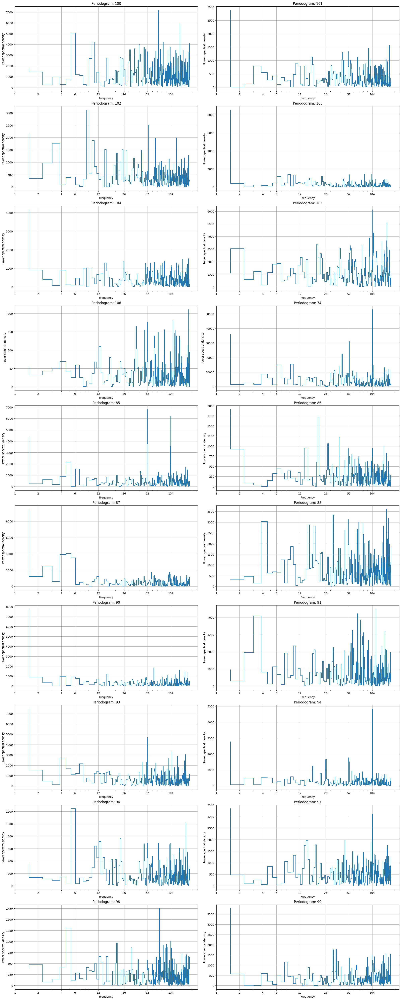

In [ ]:
plot_periodogram(cleaned_ts, period=365.2425, amplitude_aggregation_mode="per-segment", xticks=[1, 2, 4, 6, 12, 26, 52, 104], segments = segments)

In [ ]:
stl_plot(ts=cleaned_ts, period=52, segments = segments)

Output hidden; open in https://colab.research.google.com to view.

In [17]:
from etna.analysis import plot_correlation_matrix

In [18]:
lags = LagTransform(in_column="target", lags=[1, 7], out_column="lag")
cleaned_ts.fit_transform([lags])

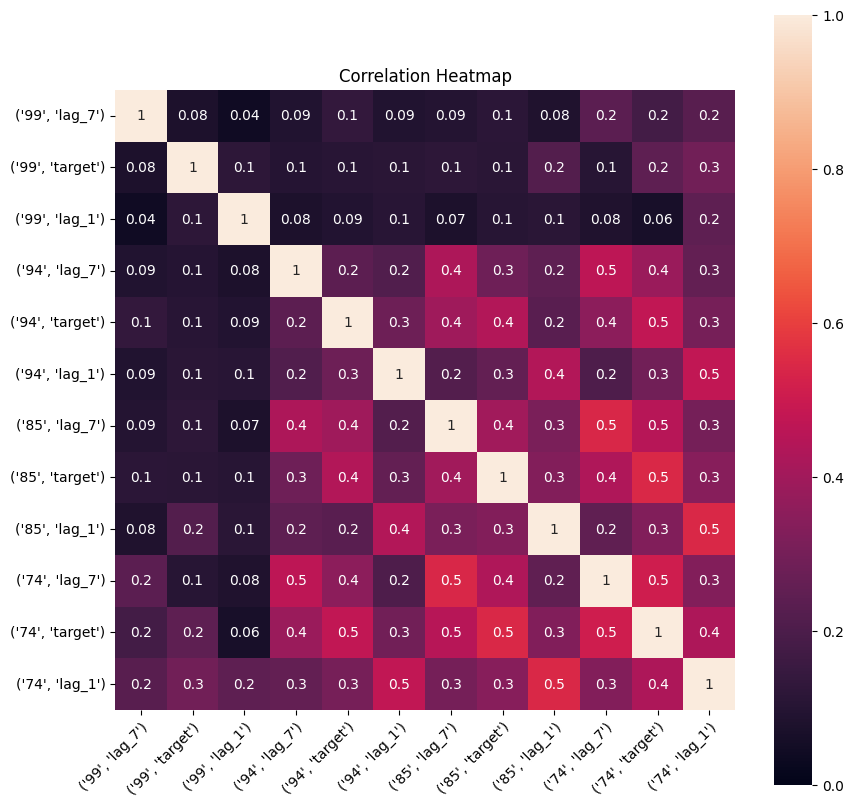

In [ ]:
plot_correlation_matrix(cleaned_ts, segments=["99", "94", "85", "74"], method="spearman", vmin=0, vmax=1)

**Итоги**: можно заметить, что наши данные имеют недельную сезонность(автокорреляция через 7 дней повышается, периодограмма имеет выраженные значения около 52 на большинстве графиков, график корреляций также показывает зависимость от 1 и 7 лага), а также ряды имеют небольшой возрастающий тренд

### Задание 2. Работа с пропущенными значениями и выбросами (1 балл)

Проанализируйте, есть ли в данных пропущенные значения, и подберите оптимальный метод их заполнения средствами ETNA. Какие методы вы выберете и почему? Совет: возможно, лучше сохранить заполненные данные в отдельный объект, поскольку некоторые модели заполняют пропуски встроенными методами, и подача на вход "сырых" данных (на языке временных рядов это данные с нерегулярными интервалами) может принести лучший результат.

Импорты всех необходимых компонент произведите самостоятельно.

In [19]:
from etna.transforms import TimeSeriesImputerTransform

Так как мы заметили, что большинство данных имеют недельную сезонность, то заполним пропуски, опираясь на неё(причём из-за тренда сделаем окно небольшим - 2 недели)

In [20]:
inputer = TimeSeriesImputerTransform(in_column="target", strategy = "seasonal", seasonality = 7, window=14)

In [21]:
ts.inverse_transform([lags])
df = ts.to_pandas()

df_filled = df.copy(deep=True)

ts_filled = TSDataset(df_filled, freq="D")

In [22]:
inputer.fit_transform(ts_filled)

segment,100,101,102,103,104,105,106,74,85,86,87,88,90,91,93,94,96,97,98,99
feature,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target
timestamp,,,,,,,,,,,,,,,,,,,,
2017-06-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.617780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.441486,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.235345,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-13.532317,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.398647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-09-26,489.428602,-161.446425,-151.650204,677.704316,114.818767,160.505046,2.794718,2297.228473,348.074726,120.378785,430.162938,511.345072,69.338415,243.022761,844.916685,517.022761,-114.083315,739.570539,547.176294,187.216663
2018-09-27,-239.492592,-438.800086,398.467898,953.351729,568.916255,836.297187,-106.787632,1693.304703,846.975950,367.520077,420.081361,382.935151,351.575478,374.727507,199.748765,753.397037,504.549495,-264.350870,-235.609405,560.208503


In [ ]:
ts_filled.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
100,2017-08-11,2018-09-30,416,0,20,0,0,0,D
101,2017-08-11,2018-09-30,416,0,20,0,0,0,D
102,2017-08-02,2018-09-30,425,0,20,0,0,0,D
103,2017-08-08,2018-09-30,419,0,20,0,0,0,D
104,2017-08-07,2018-09-30,420,0,20,0,0,0,D
105,2017-07-28,2018-09-30,430,0,20,0,0,0,D
106,2017-08-09,2018-09-30,418,0,20,0,0,0,D
74,2017-08-16,2018-09-30,411,0,20,0,0,0,D
85,2017-08-03,2018-09-30,424,0,20,0,0,0,D


Остался один пропуск. Заполним его предыдущим значением, т.к. это не будет сильно влиять на сезонность

In [23]:
inputer1 = TimeSeriesImputerTransform(in_column="target", strategy = "forward_fill")

In [24]:
inputer1.fit_transform(ts_filled)

segment,100,101,102,103,104,105,106,74,85,86,87,88,90,91,93,94,96,97,98,99
feature,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target
timestamp,,,,,,,,,,,,,,,,,,,,
2017-06-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.617780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.441486,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.235345,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-13.532317,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.398647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-09-26,489.428602,-161.446425,-151.650204,677.704316,114.818767,160.505046,2.794718,2297.228473,348.074726,120.378785,430.162938,511.345072,69.338415,243.022761,844.916685,517.022761,-114.083315,739.570539,547.176294,187.216663
2018-09-27,-239.492592,-438.800086,398.467898,953.351729,568.916255,836.297187,-106.787632,1693.304703,846.975950,367.520077,420.081361,382.935151,351.575478,374.727507,199.748765,753.397037,504.549495,-264.350870,-235.609405,560.208503


In [ ]:
ts_filled.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
100,2017-08-11,2018-09-30,416,0,20,0,0,0,D
101,2017-08-11,2018-09-30,416,0,20,0,0,0,D
102,2017-08-02,2018-09-30,425,0,20,0,0,0,D
103,2017-08-08,2018-09-30,419,0,20,0,0,0,D
104,2017-08-07,2018-09-30,420,0,20,0,0,0,D
105,2017-07-28,2018-09-30,430,0,20,0,0,0,D
106,2017-08-09,2018-09-30,418,0,20,0,0,0,D
74,2017-08-16,2018-09-30,411,0,20,0,0,0,D
85,2017-08-03,2018-09-30,424,0,20,0,0,0,D


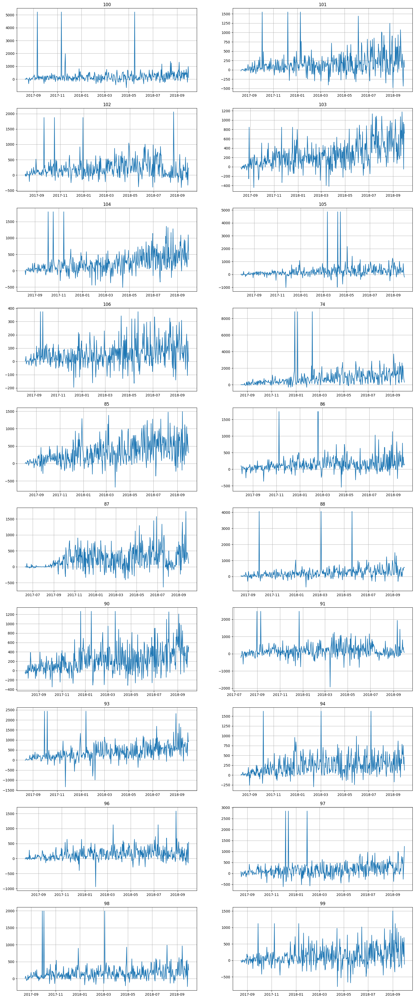

In [ ]:
ts_filled.plot(segments = segments)
plt.show()

Проверьте ряды на наличие выбросов, и очистите их соответствующим образом. Обоснуйте выбор.

In [25]:
from etna.analysis.outliers import get_anomalies_density
from etna.analysis.outliers import get_anomalies_hist
from etna.analysis.outliers import get_anomalies_median
from etna.analysis.outliers import get_anomalies_prediction_interval
from etna.analysis import plot_anomalies

In [26]:
anomaly_dict = get_anomalies_median(ts_filled, window_size=100, alpha=2.5)
plot_anomalies(ts_filled, anomaly_dict, segments = segments)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
anomaly_dict1 = get_anomalies_density(ts_filled, window_size=14, distance_coef=1, n_neighbors=3)
plot_anomalies(ts_filled, anomaly_dict1)

Output hidden; open in https://colab.research.google.com to view.

Заметим, что при подобранных гиперпараметрах модель get_anomalies_density детектирует все очевидные выбросы(в отличие от get_anomalies_median) и выделяет не так много точек

In [27]:
from etna.transforms import MedianOutliersTransform, DensityOutliersTransform
from etna.transforms import TimeSeriesImputerTransform

Сделаем замену на медиану с помощью скользящего среднего той же ширины окна, что и при get_anomalies_density

In [28]:
remover = DensityOutliersTransform(in_column="target", window_size=14, distance_coef=1, n_neighbors=3)
inputer = TimeSeriesImputerTransform(in_column="target", strategy="running_mean", window=14)

In [29]:
df_changed = ts_filled.to_pandas()

df_changed1 = df_changed.copy(deep=True)

ts_changed = TSDataset(df_changed1, freq="D")

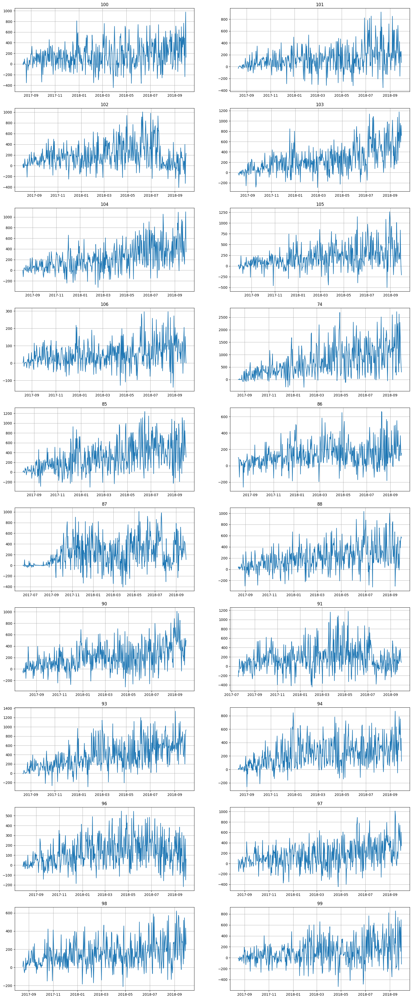

In [30]:
ts_changed.fit_transform([remover, inputer])
ts_changed.plot(segments = segments)

### Задание 3. Построение Prophet (1.25 балла)

Постройте прогнозы с помощью Prophet и `etna.Pipeline`, под капотом `etna.Pipeline` обучит `ProphetModel` для каждого сегмента в отдельности. После этого оцените качество по SMAPE на кросс-валидации. В качестве горизонта предсказания возьмите 5 дней - этого же горизонта будем придерживаться и в дальнейшем.

Отрисуйте получившийся прогноз.

In [31]:
from etna.pipeline import Pipeline
from etna.models import ProphetModel
from etna.metrics import SMAPE, MAE
from etna.analysis import plot_backtest

In [ ]:
HORIZON = 5

In [ ]:
model = ProphetModel()

pipeline = Pipeline(model=model, horizon=HORIZON)
pipeline.fit(ts_changed)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqiekprd1/l_3ro9sj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqiekprd1/jpgg4wwk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52241', 'data', 'file=/tmp/tmpqiekprd1/l_3ro9sj.json', 'init=/tmp/tmpqiekprd1/jpgg4wwk.json', 'output', 'file=/tmp/tmpqiekprd1/prophet_modelj8b2ndzf/prophet_model-20240516132400.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:24:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:24:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonalit

Pipeline(model = ProphetModel(growth = 'linear', changepoints = None, n_changepoints = 25, changepoint_range = 0.8, yearly_seasonality = 'auto', weekly_seasonality = 'auto', daily_seasonality = 'auto', holidays = None, seasonality_mode = 'additive', seasonality_prior_scale = 10.0, holidays_prior_scale = 10.0, changepoint_prior_scale = 0.05, mcmc_samples = 0, interval_width = 0.8, uncertainty_samples = 1000, stan_backend = None, additional_seasonality_params = (), timestamp_column = None, ), transforms = (), horizon = 5, )

In [ ]:
metrics, forecast, _ = pipeline.backtest(ts=ts_changed, metrics=[SMAPE(), MAE()], aggregate_metrics=True)

metrics

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqiekprd1/3dlx_7m7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqiekprd1/6wof255s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42579', 'data', 'file=/tmp/tmpqiekprd1/3dlx_7m7.json', 'init=/tmp/tmpqiekprd1/6wof255s.json', 'output', 'file=/tmp/tmpqiekprd1/prophet_model3dfewqn5/prophet_model-20240516132406.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:24:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:24:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonalit

,segment,SMAPE,MAE
0,100,81.944908,240.734116
1,101,73.684139,201.735825
2,102,98.802774,180.833819
3,103,50.496610,255.772538
4,104,54.318860,255.126484
5,105,81.463917,246.781247
6,106,72.394411,48.528349
7,74,55.345606,586.759958
8,85,53.686615,234.893224
9,86,52.142058,100.386111


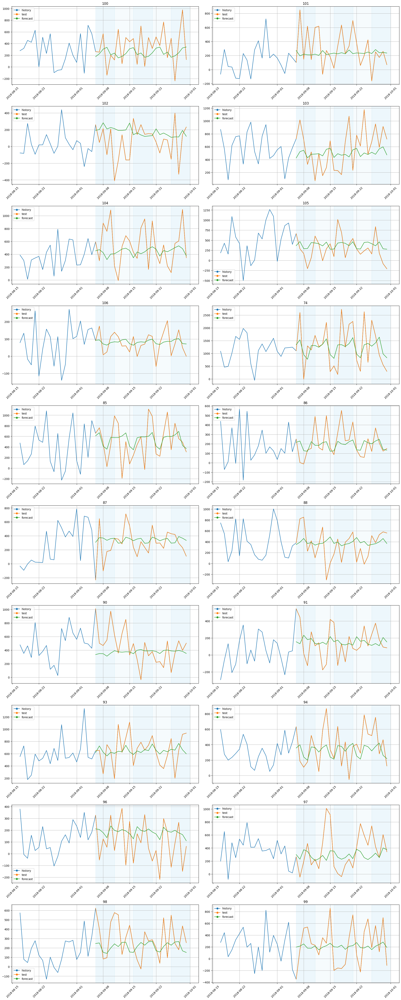

In [ ]:
plot_backtest(forecast_df=forecast, ts=ts_changed, history_len=20)

Исходя из статистики по каждому ряду, какой можно сделать вывод о том, как лучше предсказывать итоговое значение? Посчитайте то же самое исходя из MAE.

Исходя из статистик SMAPE и MAE, а также графиков предсказаний получим: из-за большого SMAPE(т.к. это относительная ошибка) можно сказать, что модель не очень хорошо учитывает тренды(в меньшей степени) и сезонности; смотря на большой MAE видим, что модель плохо угадывает изменения трендов и аномалии с пиками

### Задание 4. Иерархический временной ряд (2 балла)

Вопрос, поставленный в прошлом задании, тем не менее, естественным образом подводит нас к концепции **иерархического временного ряда** (когда один ряд состоит из других в качестве компонент). Это полезная концепция, которая может встретиться во многих задачах. В этом задании вам предстоит самостоятельно разобраться в деталях ее реализации в ETNA с использованием справочных материалов, предоставляемых библиотекой (как это часто бывает на практике). Они содержатся по следующей ссылке:

https://github.com/etna-team/etna/blob/master/examples/303-hierarchical_pipeline.ipynb

На выходе из первой части задания необходимо получить `TSDataset` с иерархической структурой, а также соответствующий реконсилятор, который позволит собирать искомый ряд из составных компонент. Классы, которые вам понадобятся, импортированы ниже.

In [ ]:
from etna.datasets import HierarchicalStructure
from etna.pipeline import HierarchicalPipeline
from etna.reconciliation import TopDownReconciliator

Во второй части задания примените найденные на предыдущих этапах преобразования очистку от выбросов уже к иерархическому датасету, и запустите на нем Prophet с MAE на кросс-валидации.

In [ ]:
#YOUR CODE HERE#

### Задание 5. Построение признаков (1.5 балла)

Вернемся к нашему исходному мультисегментному ряду - теперь поработаем с моделями, которые требуют построения признаков - `ARIMA` и `CatBoost`. Построим для них признаки, и попробуем при помощи них добиться улучшения качества.

Из обязательного:
1) постройте графики автокорреляции и при помощи них обоснуйте выбор лаговых признаков
2) для катбуста включите в признаки результаты STL разложения. STL используем для убирания тренда за счет преобразования на месте.
* Кроме этого, подумайте на экспертном уровне,
    - Какие еще закономерности могут присутствовать и почему?
    - Что из этого кажется более предсказуемым, и почему?
    - Cделайте соответствующие признаки, и снабдите их кратким комментарием.

3) После этого, обучите на получившихся признаках модели. Для `CatBoost` рассмотрите 2 версии мультисегментную и на каждый ряд в отдельности.

Ниже приведены импорты, которые вам точно понадобятся - к ним необходимо добавить те инструменты, которые вы дополнительно решите использовать в анализе.

In [32]:
from etna.analysis import acf_plot, stl_plot
from etna.ensembles import DirectEnsemble, StackingEnsemble, VotingEnsemble
from etna.models import (CatBoostMultiSegmentModel, CatBoostPerSegmentModel,
                         AutoARIMAModel)
from etna.transforms import STLTransform, LagTransform, SegmentEncoderTransform, DateFlagsTransform, HolidayTransform

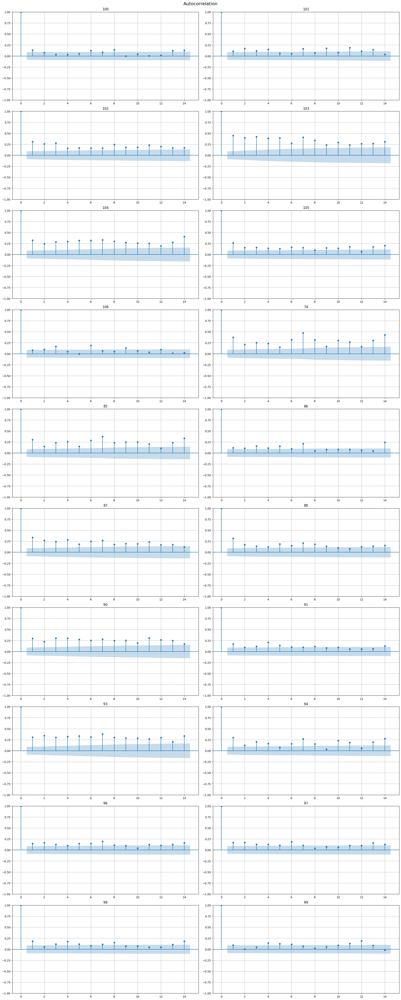

In [ ]:
acf_plot(ts_changed, lags=14, segments = segments)

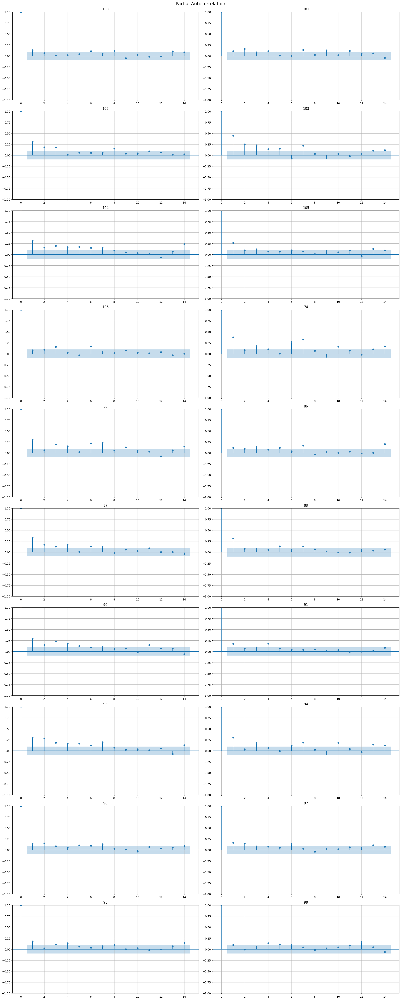

In [ ]:
acf_plot(ts_changed, lags=14, partial=True, segments = segments)

Из графиков автокорреляции и частичной автокорреляции видим, что корреляция имеет большое значение на lag1 и lag7 в большинстве моделей, однако так как горизонт равен 5, то lag1 мы не можем использовать для простого пайплайна

Кроме того на количество снимаемых денег может влиять номер дня в месяце(снимают больше после зарплаты), праздничные дни, номер месяца в году. Выделим отдельно выходные дни.

Кроме того, сильно влияет расположение банкомата, поэтому закодируем сегментарный признак(Для Arima)

In [ ]:
pipeline = Pipeline(
    transforms=[
        LagTransform(in_column="target", lags=[7]),
        SegmentEncoderTransform(),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=AutoARIMAModel(),
    horizon=HORIZON
)
metrics, forecast, _ = pipeline.backtest(
    ts=ts_changed, metrics=[SMAPE(), MAE()], aggregate_metrics=True
)

metrics

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   18.9s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   36.5s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  1.6min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  2.1min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  2.1min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    6.3s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   10.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   14.2s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   17.5s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   17.5s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

,segment,SMAPE,MAE
0,100,84.776842,245.393177
1,101,88.120898,215.243841
2,102,101.135429,176.991360
3,103,65.916599,323.584800
4,104,75.644801,333.998361
5,105,88.663065,225.165954
6,106,84.456500,50.842738
7,74,59.614880,642.160853
8,85,70.359652,270.861078
9,86,65.997960,109.372679


In [226]:
metrics.mean()

segment    5.005055e+44
SMAPE      8.124632e+01
MAE        2.409065e+02
dtype: float64

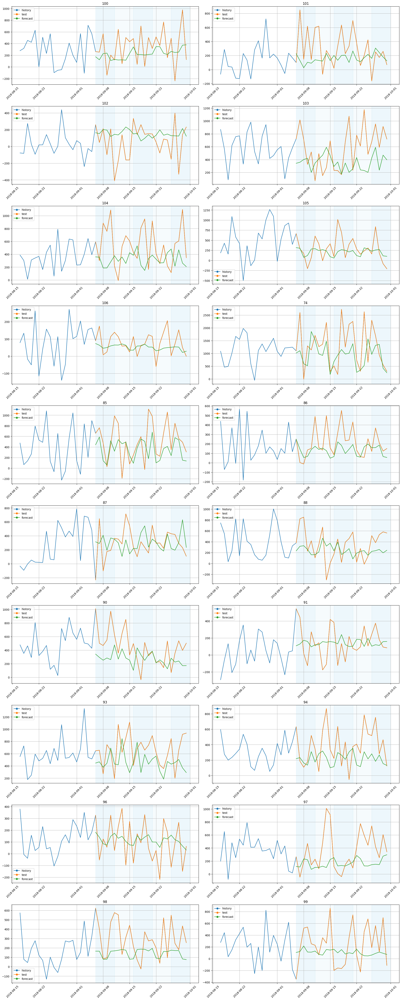

In [ ]:
plot_backtest(forecast_df=forecast, ts=ts_changed, history_len=20)

In [ ]:
pipeline = Pipeline(
    transforms=[
        STLTransform(in_column="target", period=7, model="arima"),
        LagTransform(in_column="target", lags=[7]),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=CatBoostMultiSegmentModel(),
    horizon=HORIZON,
)
metrics1, forecast1, _ = pipeline.backtest(
    ts=ts_changed, metrics=[SMAPE(), MAE()], aggregate_metrics=True
)

metrics1

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    8.5s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   18.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   26.2s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   34.9s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   44.8s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   44.8s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    4.4s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   10.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   14.9s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   19.4s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   25.3s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   25.3s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

,segment,SMAPE,MAE
0,100,83.314553,259.598432
1,101,99.653715,265.463132
2,102,152.786010,269.865903
3,103,68.490713,318.518391
4,104,65.428058,339.167522
5,105,98.014924,311.738647
6,106,90.827084,83.302936
7,74,64.710018,707.050259
8,85,79.432957,373.110531
9,86,102.673975,180.425239


In [225]:
metrics1.mean()

segment    5.005055e+44
SMAPE      9.239284e+01
MAE        2.994378e+02
dtype: float64

In [ ]:
plot_backtest(forecast_df=forecast1, ts=ts_changed, history_len=20)

Output hidden; open in https://colab.research.google.com to view.

In [227]:
pipeline = Pipeline(
    transforms=[
        STLTransform(in_column="target", period=7, model="arima"),
        LagTransform(in_column="target", lags=[7]),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=CatBoostPerSegmentModel(),
    horizon=HORIZON,
)
metrics2, forecast2, _ = pipeline.backtest(
    ts=ts_changed, metrics=[SMAPE(), MAE()], aggregate_metrics=True
)

metrics2

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   32.7s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.2min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.7min
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  2.3min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  2.8min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  2.8min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    5.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   10.3s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   14.9s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   21.0s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   25.7s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   25.7s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

,segment,SMAPE,MAE
0,100,82.398127,259.331747
1,101,117.317469,301.809666
2,102,158.567571,276.635233
3,103,69.954654,313.477012
4,104,63.902413,321.578699
5,105,95.585534,320.437730
6,106,92.702737,89.587443
7,74,63.835200,693.709090
8,85,80.501040,399.161172
9,86,101.114913,181.712760


In [229]:
metrics2.mean()

segment    5.005055e+44
SMAPE      9.339744e+01
MAE        3.013219e+02
dtype: float64

In [ ]:
plot_backtest(forecast_df=forecast2, ts=ts_changed, history_len=20)

Output hidden; open in https://colab.research.google.com to view.

### Задание 6. Стратегии прогнозирования (1.25 балла)

Как нам известно по семинарским занятиям, при построении прогноза на горизонте дальше следующего наблюдения перед нами встает задача определиться со стратегией генерации прогноза. Попробуйте разные стратегии на нашем горизонте из 5 дней (прямая, рекурсивная). Какая стратегия в совокупности с какой моделью дает лучший результат?

Учитывайте особенности, которые некоторые стратегии могут накладывать на признаки (в частности, на лаговые переменные).

При необходимости, в смешанном методе пользуйтесь упрощенной схемой спецификации моделей/преобразований.

In [33]:
from etna.pipeline import AutoRegressivePipeline, Pipeline, assemble_pipelines
from etna.ensembles import DirectEnsemble

Здесь добавим lag1 в рекурсивных моделях

In [35]:
HORIZON=5

In [ ]:
pipeline1_rec = AutoRegressivePipeline(
    transforms=[
        STLTransform(in_column="target", period=7, model="arima"),
        LagTransform(in_column="target", lags=[1, 7]),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=CatBoostPerSegmentModel(),
    horizon=HORIZON,
    step=1
)

metrics_rec1, forecast_rec1, _ = pipeline1_rec.backtest(
    ts=ts_changed, metrics=[SMAPE(), MAE()], aggregate_metrics=True
)

metrics_rec1

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   39.9s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  2.0min
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  2.7min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  3.6min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  3.6min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   29.5s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   59.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.7min
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  2.2min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  2.8min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  2.8min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

,segment,SMAPE,MAE
0,100,84.697785,261.348036
1,101,101.683843,281.202948
2,102,159.694175,281.087993
3,103,72.257394,323.510746
4,104,63.620319,326.558550
5,105,100.869308,317.466360
6,106,99.752722,102.137869
7,74,63.159510,672.608881
8,85,77.944168,375.625562
9,86,98.659986,162.712761


In [223]:
metrics_rec1.mean()

segment    5.005055e+44
SMAPE      9.100200e+01
MAE        2.940565e+02
dtype: float64

In [237]:
pipeline2_rec = AutoRegressivePipeline(
    transforms=[
        STLTransform(in_column="target", period=7, model="arima"),
        LagTransform(in_column="target", lags=[1,7]),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=CatBoostMultiSegmentModel(),
    horizon=HORIZON,
)
metrics_rec2, forecast_rec2, _ = pipeline2_rec.backtest(
    ts=ts_changed, metrics=[SMAPE(), MAE()], aggregate_metrics=True
)

metrics_rec2

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   10.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   20.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   30.3s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   39.1s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   49.1s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   49.1s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   28.3s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   57.3s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.4min
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  1.9min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  2.4min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  2.4min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

,segment,SMAPE,MAE
0,100,84.439171,269.925767
1,101,103.400623,262.137439
2,102,150.971428,262.468469
3,103,69.171000,320.591835
4,104,65.420421,336.122614
5,105,95.108610,306.667025
6,106,94.570543,88.708057
7,74,64.262299,687.724904
8,85,77.332292,372.715740
9,86,90.710005,157.540577


In [238]:
metrics_rec2.mean()

segment    5.005055e+44
SMAPE      8.951829e+01
MAE        2.937742e+02
dtype: float64

Заметим, что при добавлении лага 1 и Рекурсивном методе прогноз лучше чем при изначальных

In [241]:
pipeline_str1 = Pipeline(
    transforms=[
        LagTransform(in_column="target", lags=[7]),
        SegmentEncoderTransform(),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=AutoARIMAModel(),
    horizon=HORIZON
)
pipeline_str2 = Pipeline(
    transforms=[
        LagTransform(in_column="target", lags=[7]),
        SegmentEncoderTransform(),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=AutoARIMAModel(),
    horizon=HORIZON+1
)

ensemble = DirectEnsemble(pipelines=[pipeline_str1, pipeline_str2])

metrics_ensemble1, forecast_ensemble1, _ = ensemble.backtest(ts=ts_changed, metrics=[SMAPE(), MAE()])

metrics_ensemble1

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   20.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   37.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   37.2s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   37.2s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   15.8s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   31.9s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   31.9s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.2min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   33.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  2.3min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   28.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   55.8s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   55.8s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  3.2min
[Parallel(n_jobs=1)]: Do

,segment,SMAPE,MAE,fold_number
0,100,126.877039,325.088958,0
0,100,91.047488,242.590233,1
0,100,85.282352,230.637605,2
0,100,74.730597,217.864641,3
0,100,90.738829,307.332436,4
...,...,...,...,...
19,99,144.096404,286.777853,0
19,99,65.481075,170.641834,1
19,99,155.585441,336.002334,2
19,99,153.993570,318.190643,3


In [243]:
metrics_ensemble1.mean()

segment        1.001001e+232
SMAPE           8.236838e+01
MAE             2.387293e+02
fold_number     2.000000e+00
dtype: float64

In [244]:
pipeline2_str1 = AutoRegressivePipeline(
    transforms=[
        STLTransform(in_column="target", period=7, model="arima"),
        LagTransform(in_column="target", lags=[1,7]),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=CatBoostMultiSegmentModel(),
    horizon=HORIZON,
)
pipeline2_str2 = AutoRegressivePipeline(
    transforms=[
        STLTransform(in_column="target", period=7, model="arima"),
        LagTransform(in_column="target", lags=[1,7]),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=CatBoostMultiSegmentModel(),
    horizon=HORIZON+1,
)
ensemble2 = DirectEnsemble(pipelines=[pipeline2_str1, pipeline2_str2])

metrics_ensemble2, forecast_ensemble2, _ = ensemble2.backtest(ts=ts_changed, metrics=[SMAPE(), MAE()])

metrics_ensemble2

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   10.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   19.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   19.2s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   19.2s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    8.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   18.4s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   18.4s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   37.6s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   10.9s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   19.3s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   19.3s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   57.0s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    9.6s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   20.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   20.0s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Do

,segment,SMAPE,MAE,fold_number
0,100,126.586459,317.721467,0
0,100,107.852113,266.798674,1
0,100,113.596605,288.142783,2
0,100,68.302969,301.473571,3
0,100,91.502639,363.425252,4
...,...,...,...,...
19,99,106.496258,349.651333,0
19,99,178.934535,450.560154,1
19,99,161.922729,411.742954,2
19,99,166.473056,456.328920,3


In [245]:
metrics_ensemble2.mean()

segment        1.001001e+232
SMAPE           9.277961e+01
MAE             2.824946e+02
fold_number     2.000000e+00
dtype: float64

In [246]:
pipeline3_str1 = AutoRegressivePipeline(
    transforms=[
        STLTransform(in_column="target", period=7, model="arima"),
        LagTransform(in_column="target", lags=[1,7]),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=CatBoostPerSegmentModel(),
    horizon=HORIZON,
)
pipeline3_str2 = AutoRegressivePipeline(
    transforms=[
        STLTransform(in_column="target", period=7, model="arima"),
        LagTransform(in_column="target", lags=[1,7]),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=CatBoostPerSegmentModel(),
    horizon=HORIZON+1,
)
ensemble3 = DirectEnsemble(pipelines=[pipeline3_str1, pipeline3_str2])

metrics_ensemble3, forecast_ensemble3, _ = ensemble3.backtest(ts=ts_changed, metrics=[SMAPE(), MAE()])

metrics_ensemble3

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   38.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   40.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  2.6min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   42.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.4min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.4min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  3.9min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   42.6s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.4min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.4min
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  5.3min
[Parallel(n_jobs=1)]: Do

,segment,SMAPE,MAE,fold_number
0,100,129.824079,336.844614,0
0,100,101.868091,244.947283,1
0,100,109.713872,281.941668,2
0,100,75.606455,323.038384,3
0,100,89.447809,323.698227,4
...,...,...,...,...
19,99,120.691411,360.780343,0
19,99,177.644032,414.521520,1
19,99,168.679144,397.124324,2
19,99,157.541602,452.785569,3


In [248]:
metrics_ensemble3.mean()

segment        1.001001e+232
SMAPE           9.351348e+01
MAE             2.838493e+02
fold_number     2.000000e+00
dtype: float64

Среди DirectEnsemble лучше работать начинает только при AutoARIMAModel

### Задание 7. Ансамбли (1.25 балла)

Чтобы не выбирать лучшую модель, мы можем использовать преимущества каждой - давайте объединим все наши наработки в ансамбль. Попробуйте различные опции ансамблирования, и выберите ту, которая работает лучше всего (не забывайте, что внутри каждого ансамбля у нас тоже есть параметры, которые мы можем варьировать - веса в voting, включаемые признаки в stacking).

In [37]:
from etna.ensembles import StackingEnsemble, VotingEnsemble

Попробуем сделать модель из лучше всего работающей прямопрогнозирующей AutoARIMAModel с большим весом 9 и весами по 1 чуть хуже работающих моделей CatBoostMultiSegmentModel и CatBoostPerSegmentModel для рекурсивного способа

Данные веса были подобраны экспериментами

In [38]:
en_pipeline1 = Pipeline(
    transforms=[
        LagTransform(in_column="target", lags=[7]),
        SegmentEncoderTransform(),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=AutoARIMAModel(),
    horizon=HORIZON
)

en_pipeline2 = Pipeline(
    transforms=[
        STLTransform(in_column="target", period=7, model="arima"),
        LagTransform(in_column="target", lags=[7]),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=CatBoostMultiSegmentModel(),
    horizon=HORIZON,
)

en_pipeline3 = Pipeline(
    transforms=[
        STLTransform(in_column="target", period=7, model="arima"),
        LagTransform(in_column="target", lags=[7]),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=CatBoostPerSegmentModel(),
    horizon=HORIZON,
)

en_pipeline4 = AutoRegressivePipeline(
    transforms=[
        STLTransform(in_column="target", period=7, model="arima"),
        LagTransform(in_column="target", lags=[1,7]),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=CatBoostMultiSegmentModel(),
    horizon=HORIZON,
)

en_pipeline5 = AutoRegressivePipeline(
    transforms=[
        STLTransform(in_column="target", period=7, model="arima"),
        LagTransform(in_column="target", lags=[1, 7]),
        DateFlagsTransform(day_number_in_week=False, day_number_in_month=True, week_number_in_month=False, week_number_in_year=False, month_number_in_year=True, year_number=False, special_days_in_week=[5, 6]),
        HolidayTransform(iso_code="RUS"),
    ],
    model=CatBoostPerSegmentModel(),
    horizon=HORIZON,
    step=1
)

In [261]:
voting_ensemble1 = VotingEnsemble(pipelines=[en_pipeline1, en_pipeline4, en_pipeline5], weights=[9, 1, 1], n_jobs=1)

In [262]:
voting_ensamble_metrics,_,_ = voting_ensemble1.backtest(
    ts=ts_changed,
    metrics=[MAE(), SMAPE()],
    n_folds=5,
    aggregate_metrics=True,
    n_jobs=1,
)

#voting_ensamble_metrics.index = ["voting ensemble"]
#voting_ensamble_metrics

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   16.4s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   26.5s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   16.6s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   27.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  2.4min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   27.7s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   37.4s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  3.9min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   28.4s
[Parallel(n_jobs=1)]: Do

ValueError: Length mismatch: Expected axis has 20 elements, new values have 1 elements

In [265]:
voting_ensamble_metrics

,segment,MAE,SMAPE
0,100,236.280840,80.712102
1,101,208.800698,86.921307
2,102,187.724550,115.431801
3,103,292.772173,59.133205
4,104,317.048716,70.268627
5,105,233.685251,93.192724
6,106,52.594369,82.509740
7,74,619.809782,56.472598
8,85,263.483560,68.790331
9,86,103.971307,63.773329


In [266]:
voting_ensamble_metrics.mean()

segment    5.005055e+44
MAE        2.349675e+02
SMAPE      7.985099e+01
dtype: float64

Полученные прогнозы ещё лучше чем все старые

In [39]:
voting_ensemble2 = VotingEnsemble(pipelines=[en_pipeline1, en_pipeline2, en_pipeline3], weights=[9, 1, 1], n_jobs=1)

In [40]:
voting_ensamble_metrics2,_,_ = voting_ensemble2.backtest(
    ts=ts_changed,
    metrics=[MAE(), SMAPE()],
    n_folds=5,
    aggregate_metrics=True,
    n_jobs=1,
)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   16.6s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   25.8s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   58.2s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   58.2s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   58.2s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   18.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   26.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  2.0min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   27.9s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   45.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  3.3min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   29.6s
[Parallel(n_jobs=1)]: Do

In [41]:
voting_ensamble_metrics2

,segment,MAE,SMAPE
0,100,235.515673,80.062624
1,101,206.910834,82.463840
2,102,184.711767,114.651042
3,103,291.955160,58.820889
4,104,316.361993,70.147686
5,105,234.092859,92.058149
6,106,51.439473,81.028136
7,74,620.291469,56.469873
8,85,263.920129,68.760228
9,86,105.324444,63.994745


In [42]:
voting_ensamble_metrics2.mean()

segment    5.005055e+44
MAE        2.343744e+02
SMAPE      7.928582e+01
dtype: float64

Как итог получаем, что ещё лучше не использовать рекурсивные методы

Теперь попробуем для прямых методов сделать StackingEnsemble

In [45]:
stacking_ensemble_unfeatured = StackingEnsemble(pipelines=[en_pipeline1, en_pipeline2, en_pipeline3], n_folds=5, n_jobs=1)

In [46]:
stacking_ensamble_metrics = stacking_ensemble_unfeatured.backtest(
    ts=ts_changed,
    metrics=[MAE(), SMAPE()],
    n_folds=5,
    aggregate_metrics=True,
    n_jobs=1,
)

stacking_ensamble_metrics

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   16.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   32.8s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   52.6s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  1.4min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  1.4min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    7.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   10.0s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   12.9s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   15.9s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   15.9s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Do

(   segment         MAE       SMAPE
 0      100  216.194022   69.227615
 1      101  206.304931   74.805086
 2      102  210.795575  101.788434
 3      103  273.019812   54.233550
 4      104  304.296246   63.492341
 5      105  232.211583   80.420280
 6      106   74.959345   80.660661
 7       74  579.505136   52.638709
 8       85  248.387586   57.491498
 9       86   99.259987   52.663743
 10      87  219.440737   63.345909
 11      88  217.529244   69.688571
 12      90  207.887392   51.836813
 13      91  198.090576   99.622517
 14      93  238.084216   38.434079
 15      94  197.449982   56.543878
 16      96  156.818521   99.327659
 17      97  240.739909   78.686170
 18      98  153.732587   58.944987
 19      99  298.968655  111.449056,
 segment            100                                        \
 feature    fold_number regressor_target_0 regressor_target_1   
 timestamp                                                      
 2018-09-06           0         176.287736      

In [51]:
stacking_ensamble_metrics[0].mean()

segment    5.005055e+44
MAE        2.286838e+02
SMAPE      7.076508e+01
dtype: float64

Итого модель StackingEnsemble работает лучше всего

### Задание 8*. Трансформер (бонус 2 балла)

Для желающих протестировать мощь трансформенных моделей предлагается "завести" модель из второго семинара по временным рядам на текущем датасете. На этот раз абсолютно все необходимые импорты и зависимости подгружаются на ваше усмотрение. Удалось ли вам улучшить качество по сравнению с классическими моделями / моделями на основе ML? Что бы вы предпочли внедрить в production?

*NB:* все, конечно, прекрасно знают механизм работы бонусных заданий, но порядка ряди прописать дисклеймер должны - итоговый балл за домашнее задание ставится по формуле min(10, ваш суммарный балл за задания).

In [ ]:
#YOUR CODE HERE#